# EDA
## GSB 545 Final Project
### NBA Dataset


In [1]:
### load packages
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from plotnine import *
import sweetviz as sv


In [2]:
### load dataset
df = pd.read_csv('../V2 Model(Performance Based)/NBADataCleanV4.csv')
df.head()

,season,player_name,salary,team_abbr,team_name,position,age,height_inches,weight_lbs,college,...,archetype_confidence_score,archetype_is_lead_creator_guard,archetype_is_scoring_guard_wing,archetype_is_three_and_d_wing,archetype_is_stretch_big,archetype_is_rim_protector_big,archetype_is_interior_big_finisher,archetype_is_balanced_connector,archetype_share_in_season,archetype_scarcity_index
0,2000,Al Harrington,745000,IND,Indiana Pacers,PF,19,81.0,245.0,St. Patrick HS (NJ),...,0.649020,0,0,0,0,0,0,1,0.627451,1.593750
1,2000,Alan Henderson,5318000,ATL,Atlanta Hawks,PF,27,81.0,240.0,Indiana,...,0.452614,0,0,0,0,0,1,0,0.032680,30.600000
2,2000,Aleksandar Radojevic,1325000,TOR,Toronto Raptors,C,23,87.0,250.0,Buducnost,...,0.649020,0,0,0,0,0,0,1,0.627451,1.593750
3,2000,Allen Iverson,9000000,PHI,Philadelphia 76ers,SG,24,72.0,165.0,Georgetown,...,0.526915,0,0,1,0,0,0,0,0.143791,6.954545
4,2000,Alonzo Mourning,15004000,MIA,Miami Heat,C,29,82.0,261.0,Georgetown,...,0.943978,0,0,0,0,1,0,0,0.176471,5.666667


                                             |          | [  0%]   00:00 -> (? left)

KeyboardInterrupt: 

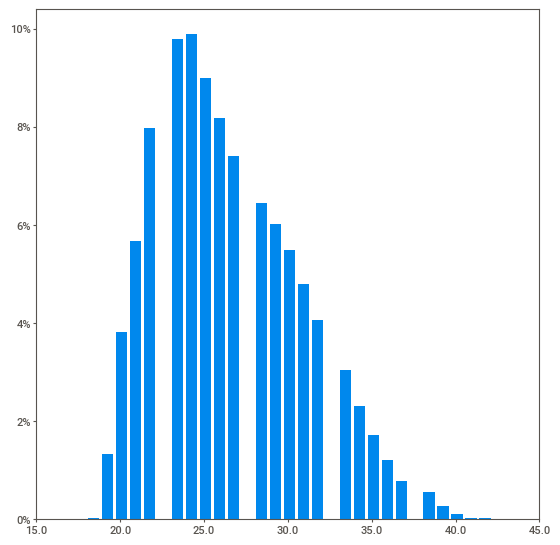

In [3]:
### sweetviz report

report = sv.analyze(df)
report.show_html('NBA_report.html')

In [4]:
### summary statistics

from IPython.display import display

### dataset overview
dataset_overview = pd.DataFrame({
    "metric": ["rows", "columns", "duplicate_rows"],
    "value": [df.shape[0], df.shape[1], df.duplicated().sum()]
})

display(dataset_overview)

### missing values, data types, and unique counts
missing_summary = (
    pd.DataFrame({
        "data_type": df.dtypes.astype(str),
        "missing_count": df.isna().sum(),
        "missing_percent": df.isna().mean().mul(100).round(2),
        "unique_values": df.nunique(dropna=True)
    })
    .sort_values("missing_percent", ascending=False)
)

display(missing_summary)

### Numeric summary statistics
numeric_summary = df.select_dtypes(include=np.number).describe(
    percentiles=[0.01, 0.05, 0.25, 0.50, 0.75, 0.95, 0.99]
).T

numeric_summary["missing_count"] = df.select_dtypes(include=np.number).isna().sum()
numeric_summary["missing_percent"] = df.select_dtypes(include=np.number).isna().mean().mul(100).round(2)

display(numeric_summary)

### categorical summary statistics
categorical_summary = df.select_dtypes(exclude=np.number).describe().T

categorical_summary["missing_count"] = df.select_dtypes(exclude=np.number).isna().sum()
categorical_summary["missing_percent"] = df.select_dtypes(exclude=np.number).isna().mean().mul(100).round(2)

display(categorical_summary)

### salary summary by season and position
salary_by_position = (
    df.groupby(["season", "position_primary_group_5"], dropna=False)
    .agg(
        observations=("salary", "size"),
        players=("player_name", "nunique"),
        mean_salary=("salary", "mean"),
        median_salary=("salary", "median"),
        min_salary=("salary", "min"),
        max_salary=("salary", "max")
    )
    .reset_index()
)

display(salary_by_position.head(20))


,metric,value
0,rows,10469
1,columns,148
2,duplicate_rows,0


,data_type,missing_count,missing_percent,unique_values
reg_win_rate,float64,10469,100.00,0
rolling3_adv_net_rating_prior,float64,2767,26.43,7338
rolling3_adv_true_shooting_pct_prior,float64,2767,26.43,7157
prev_team_win_pct_regular,float64,2638,25.20,141
rolling3_team_win_pct_regular_prior,float64,2502,23.90,1833
...,...,...,...,...
archetype_is_rim_protector_big,int64,0,0.00,2
archetype_is_interior_big_finisher,int64,0,0.00,2
archetype_is_balanced_connector,int64,0,0.00,2
archetype_share_in_season,float64,0,0.00,175


,count,mean,std,min,1%,5%,25%,50%,75%,95%,99%,max,missing_count,missing_percent
season,10469.0,2.013870e+03,7.178961e+00,2000.000000,2000.000000,2002.000000,2.008000e+03,2.014000e+03,2.020000e+03,2.024000e+03,2.025000e+03,2.025000e+03,0,0.00
salary,10469.0,5.823480e+06,7.592610e+06,2692.000000,57672.000000,316000.000000,1.152829e+06,2.958077e+06,7.333333e+06,2.083008e+07,3.850648e+07,5.576122e+07,0,0.00
age,10469.0,2.646767e+01,4.300011e+00,18.000000,19.000000,20.000000,2.300000e+01,2.600000e+01,2.900000e+01,3.400000e+01,3.800000e+01,4.300000e+01,0,0.00
height_inches,9660.0,7.897101e+01,3.523623e+00,63.000000,71.000000,73.000000,7.600000e+01,7.900000e+01,8.200000e+01,8.400000e+01,8.600000e+01,9.000000e+01,809,7.73
weight_lbs,9660.0,2.221582e+02,2.692979e+01,133.000000,170.000000,180.000000,2.010000e+02,2.200000e+02,2.400000e+02,2.650000e+02,2.850000e+02,3.600000e+02,809,7.73
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
archetype_is_rim_protector_big,10469.0,1.605693e-01,3.671508e-01,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,0,0.00
archetype_is_interior_big_finisher,10469.0,1.805330e-02,1.331506e-01,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,0,0.00
archetype_is_balanced_connector,10469.0,5.623269e-01,4.961238e-01,0.000000,0.000000,0.000000,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,0,0.00
archetype_share_in_season,10469.0,3.663662e-01,2.276349e-01,0.004975,0.017073,0.039426,1.380846e-01,5.341463e-01,5.632184e-01,6.232687e-01,6.293532e-01,6.293532e-01,0,0.00


,count,unique,top,freq,missing_count,missing_percent
player_name,10469,2133,Vince Carter,21,0,0.00
team_abbr,10469,37,PHI,369,0,0.00
team_name,10469,36,Philadelphia 76ers,369,0,0.00
position,10469,16,SG,2218,0,0.00
college,9443,468,Kentucky,305,1026,9.80
country,8231,70,USA,6759,2238,21.38
birthplace,9092,769,"Los Angeles, California",282,1377,13.15
shoots,9092,3,Right,8299,1377,13.15
team_region,10469,4,west,4878,0,0.00
contract_type,10469,6,extension,7598,0,0.00


,season,position_primary_group_5,observations,players,mean_salary,median_salary,min_salary,max_salary
0,2000,C,33,33,5.190758e+06,4490000.0,857000,17142000
1,2000,PF,33,33,5.314212e+06,3937000.0,679000,16806000
2,2000,PG,30,30,4.071600e+06,3010000.0,301000,11020000
3,2000,SF,35,35,3.002686e+06,2011000.0,684000,14795000
4,2000,SG,22,22,3.905227e+06,2297500.0,878000,9000000
5,2001,C,81,81,4.294346e+06,2970000.0,26000,19285000
6,2001,PF,69,69,4.541304e+06,2750000.0,37000,19600000
7,2001,PG,82,82,2.650220e+06,1774000.0,32000,12200000
8,2001,SF,74,74,2.919797e+06,2036500.0,24000,13151000
9,2001,SG,55,55,3.446200e+06,2200000.0,316000,10666000


In [8]:
repeat_players = df["player_name"].value_counts()
repeat_players = repeat_players[repeat_players > 1]

repeat_players


player_name
Vince Carter               21
Chris Paul                 20
Kyle Lowry                 19
LeBron James               19
Jamal Crawford             19
                           ..
Scoot Henderson             2
Rayan Rupert                2
Pat Spencer                 2
Olivier-Maxence Prosper     2
Noah Clowney                2
Name: count, Length: 1661, dtype: int64

,categorical_variable,unique_values,non_missing_rows
0,position,16,10469
1,shoots,3,9092
2,team_region,4,10469
3,contract_type,6,10469
4,position_primary_group_5,5,10469
5,position_secondary_group_5,6,10469
6,cba_service_bucket,4,10469
7,max_salary_tier_proxy,3,10469
8,archetype_label,7,10469


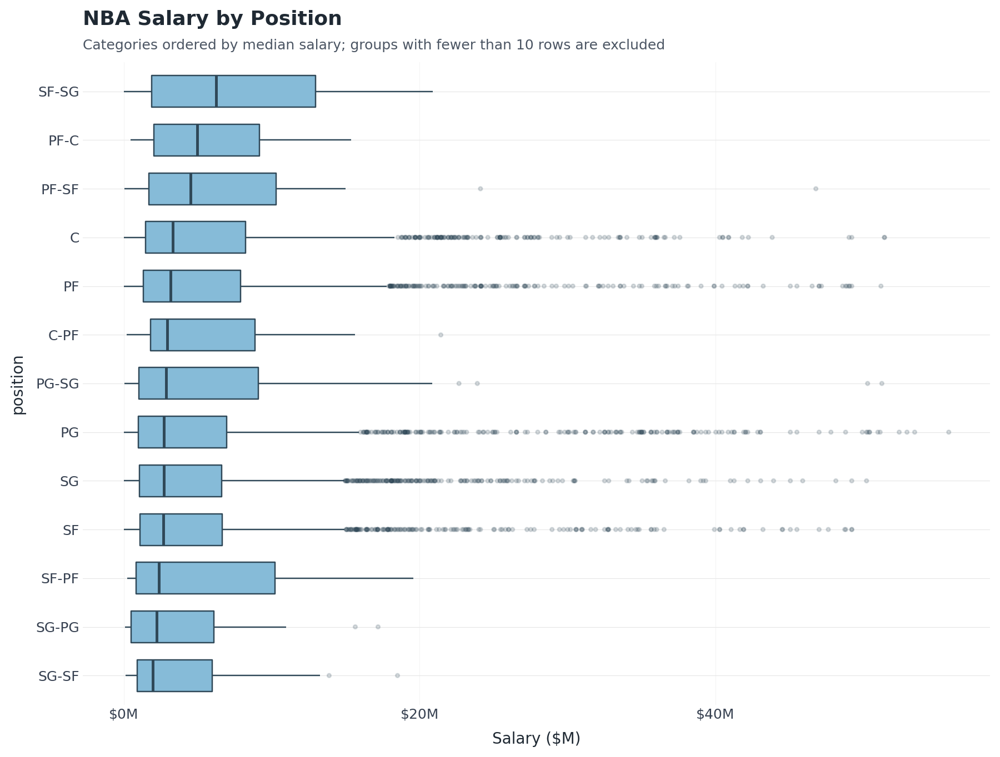

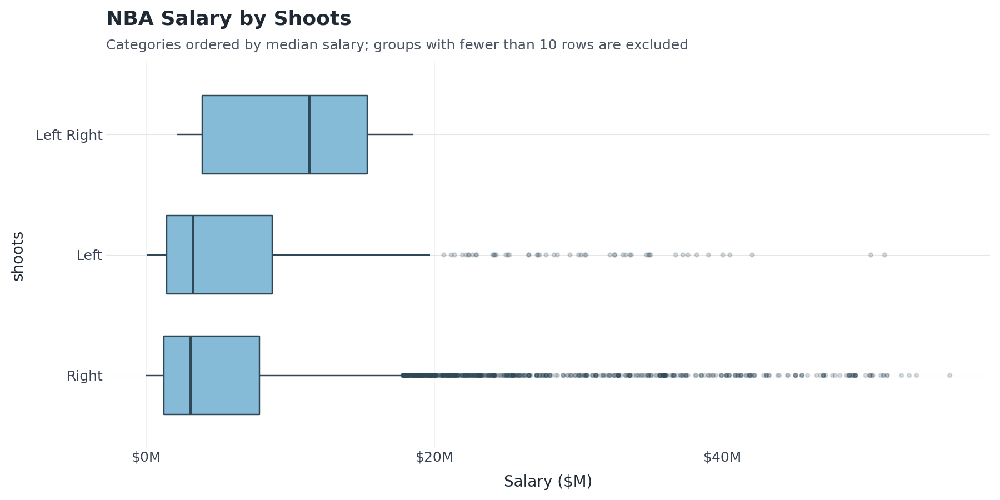

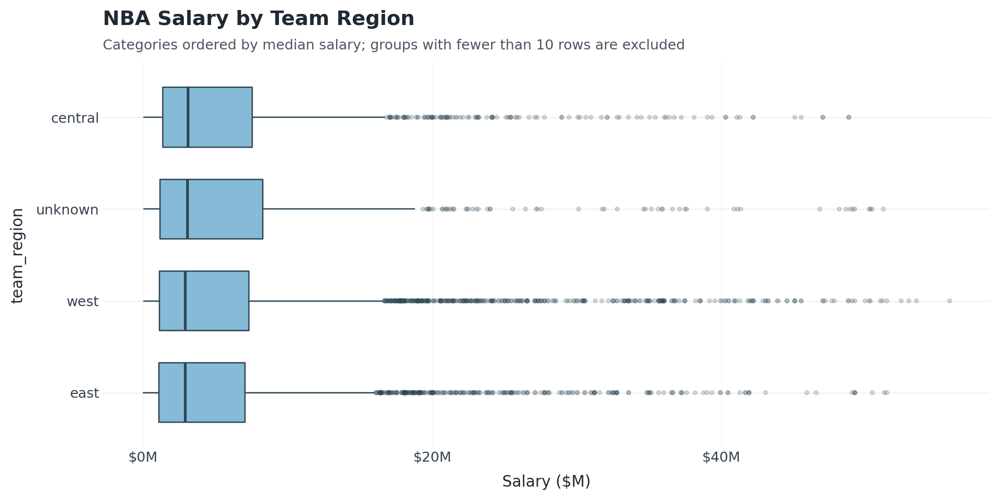

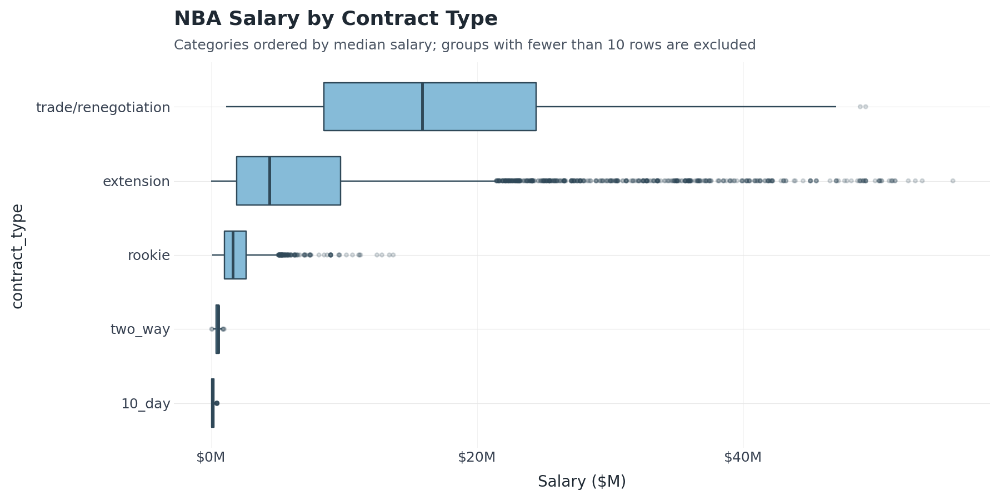

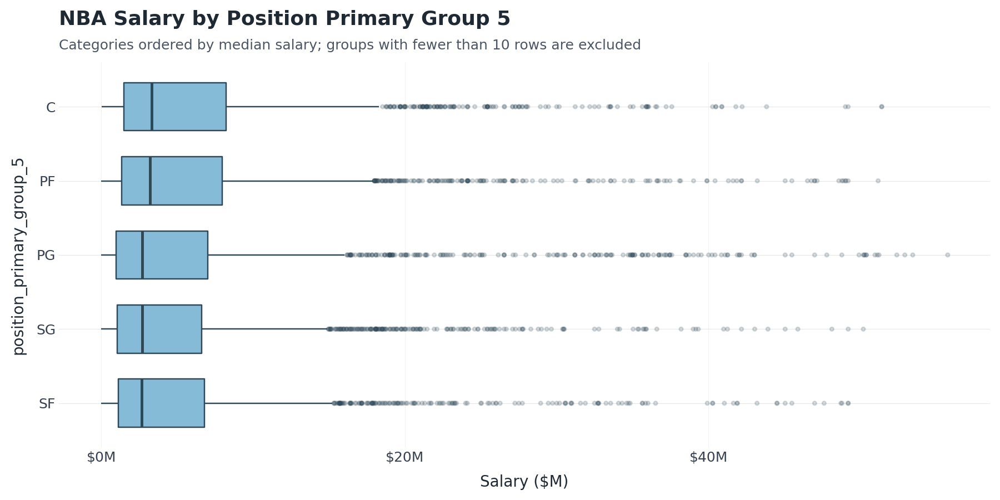

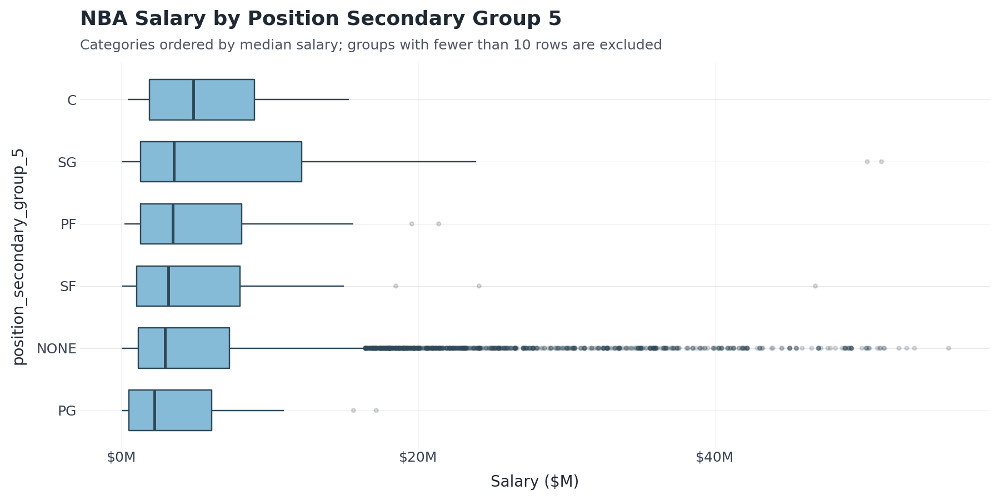

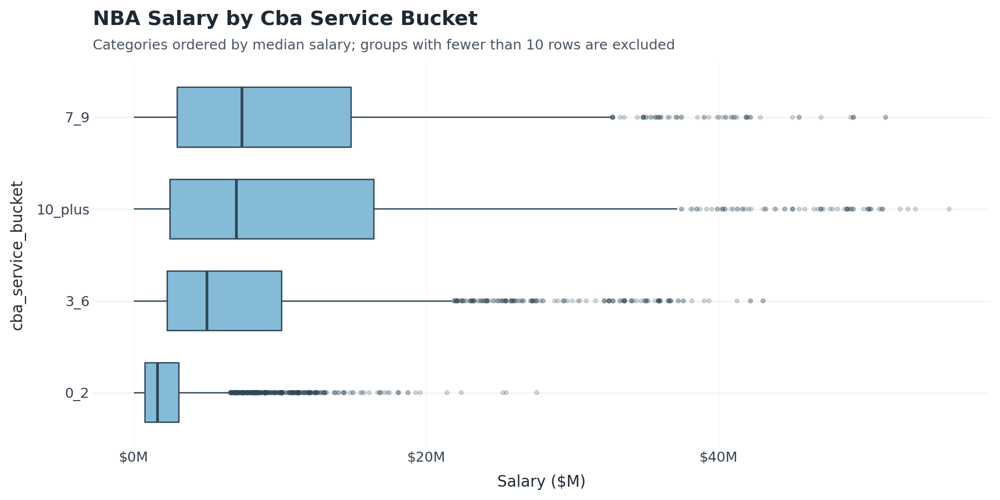

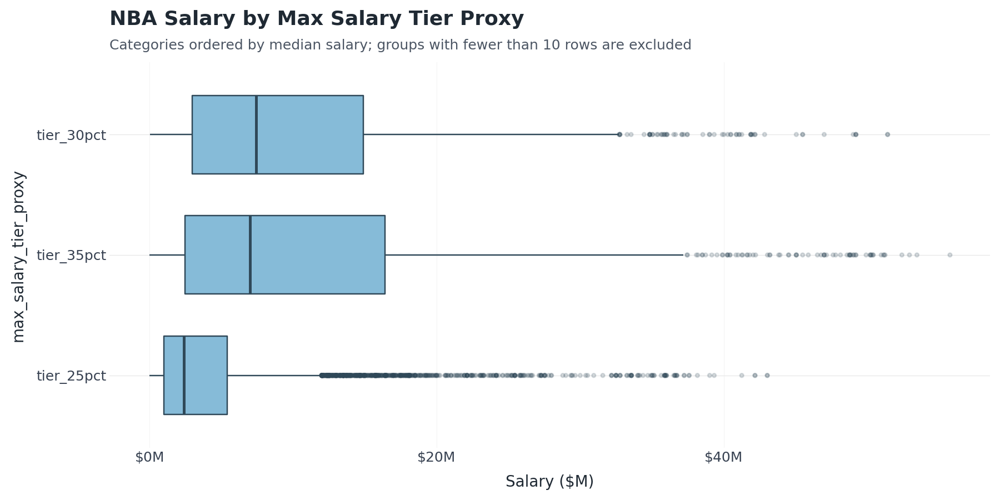

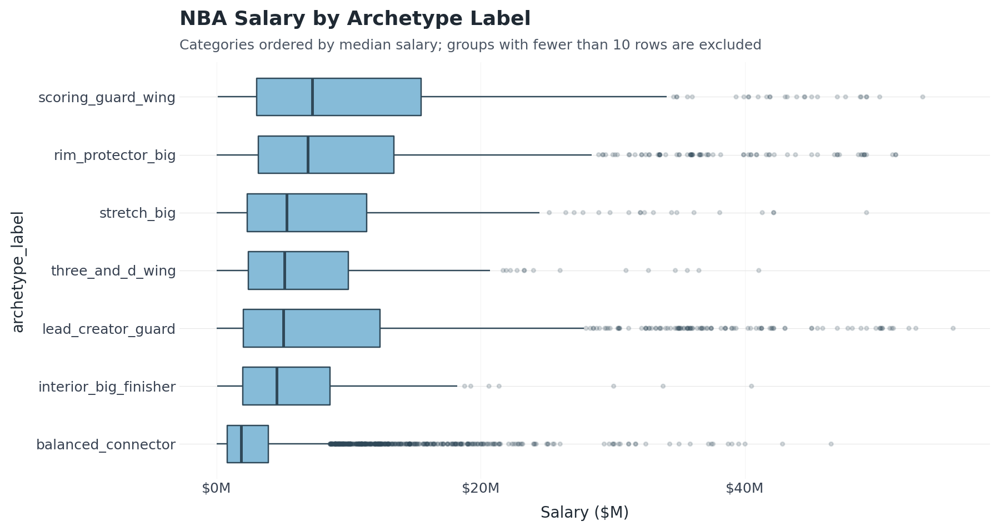

In [5]:
### box plot categorical variables against target variable NBA salary

from IPython.display import display

salary_target = "salary"
salary_plot_df = df.dropna(subset=[salary_target]).copy()
salary_plot_df["salary_millions"] = salary_plot_df[salary_target] / 1_000_000

def pretty_variable_name(col):
    return col.replace("_", " ").title()

def dollar_millions(values):
    return [f"${value:,.0f}M" for value in values]

def nba_eda_theme(width=9, height=5):
    return (
        theme_minimal(base_size=11)
        + theme(
            figure_size=(width, height),
            panel_grid_minor=element_blank(),
            panel_grid_major_y=element_line(color="#E6E6E6", size=0.4),
            panel_grid_major_x=element_line(color="#F0F0F0", size=0.3),
            plot_title=element_text(size=13, weight="bold", color="#1F2933"),
            plot_subtitle=element_text(size=9, color="#4B5563"),
            axis_title=element_text(size=10, color="#1F2933"),
            axis_text=element_text(size=9, color="#374151"),
        )
    )

### focus on interpretable categorical variables instead of player/team identifiers
preferred_categorical_cols = [
    "position",
    "shoots",
    "team_region",
    "contract_type",
    "position_primary_group_5",
    "position_secondary_group_5",
    "cba_service_bucket",
    "max_salary_tier_proxy",
    "archetype_label",
]

identifier_like_cols = {
    "player_name",
    "team_name",
    "college",
    "country",
    "birthplace",
}

categorical_boxplot_cols = [
    col for col in preferred_categorical_cols
    if col in salary_plot_df.columns
]

auto_categorical_cols = [
    col for col in salary_plot_df.select_dtypes(exclude=np.number).columns
    if col not in identifier_like_cols
    and salary_plot_df[col].nunique(dropna=True) <= 20
]

categorical_boxplot_cols = list(dict.fromkeys(categorical_boxplot_cols + auto_categorical_cols))

category_plot_summary = pd.DataFrame({
    "categorical_variable": categorical_boxplot_cols,
    "unique_values": [salary_plot_df[col].nunique(dropna=True) for col in categorical_boxplot_cols],
    "non_missing_rows": [salary_plot_df[col].notna().sum() for col in categorical_boxplot_cols],
})

display(category_plot_summary)

def plot_salary_boxplot_by_category(data, category_col, min_rows_per_category=10, max_categories=20):
    plot_data = data[[category_col, "salary_millions"]].dropna().copy()
    plot_data[category_col] = plot_data[category_col].astype(str)

    counts = plot_data[category_col].value_counts()
    keep_categories = counts[counts >= min_rows_per_category].index
    plot_data = plot_data[plot_data[category_col].isin(keep_categories)].copy()

    if plot_data.empty:
        print(f"Skipping {category_col}: no categories with at least {min_rows_per_category} rows.")
        return

    category_order = (
        plot_data.groupby(category_col)["salary_millions"]
        .median()
        .sort_values()
        .tail(max_categories)
        .index
    )

    plot_data = plot_data[plot_data[category_col].isin(category_order)].copy()
    plot_data[category_col] = pd.Categorical(
        plot_data[category_col],
        categories=category_order,
        ordered=True,
    )

    plot_height = max(4.5, min(9.5, 2.4 + 0.34 * len(category_order)))
    p = (
        ggplot(plot_data, aes(x=category_col, y="salary_millions"))
        + geom_boxplot(
            fill="#86BBD8",
            color="#2F4858",
            outlier_alpha=0.18,
            outlier_size=0.9,
            width=0.65,
        )
        + coord_flip()
        + scale_y_continuous(labels=dollar_millions)
        + labs(
            title=f"NBA Salary by {pretty_variable_name(category_col)}",
            subtitle=f"Categories ordered by median salary; groups with fewer than {min_rows_per_category} rows are excluded",
            x=None,
            y="Salary ($M)",
        )
        + nba_eda_theme(width=9, height=plot_height)
    )
    display(p)

for col in categorical_boxplot_cols:
    plot_salary_boxplot_by_category(salary_plot_df, col)

,numeric_variable,unique_values,non_missing_rows
0,season,26,10469
1,age,26,10469
2,height_inches,31,9660
3,weight_lbs,138,9660
4,draft_year,52,8095
...,...,...,...
87,team_net_points_pg,636,9892
88,all_star_selections_through_prev_season,19,10469
89,total_all_star_selections_through_season,19,10469
90,prev_team_win_pct_regular,141,7831


c:\Users\Dirks Wright\anaconda3\Lib\site-packages\plotnine\themes\themeable.py:2486: FutureWarning: You no longer need to use subplots_adjust to make space for the legend or text around the panels. This parameter will be removed in a future version. You can still use 'plot_margin' 'panel_spacing' for your other spacing needs.


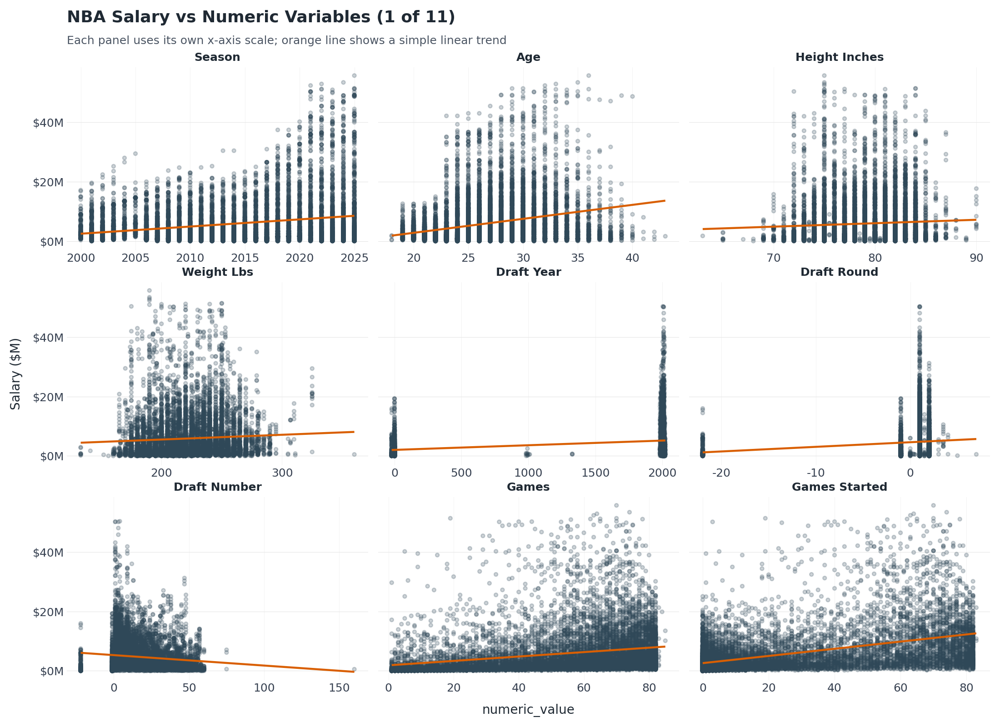

c:\Users\Dirks Wright\anaconda3\Lib\site-packages\plotnine\themes\themeable.py:2486: FutureWarning: You no longer need to use subplots_adjust to make space for the legend or text around the panels. This parameter will be removed in a future version. You can still use 'plot_margin' 'panel_spacing' for your other spacing needs.


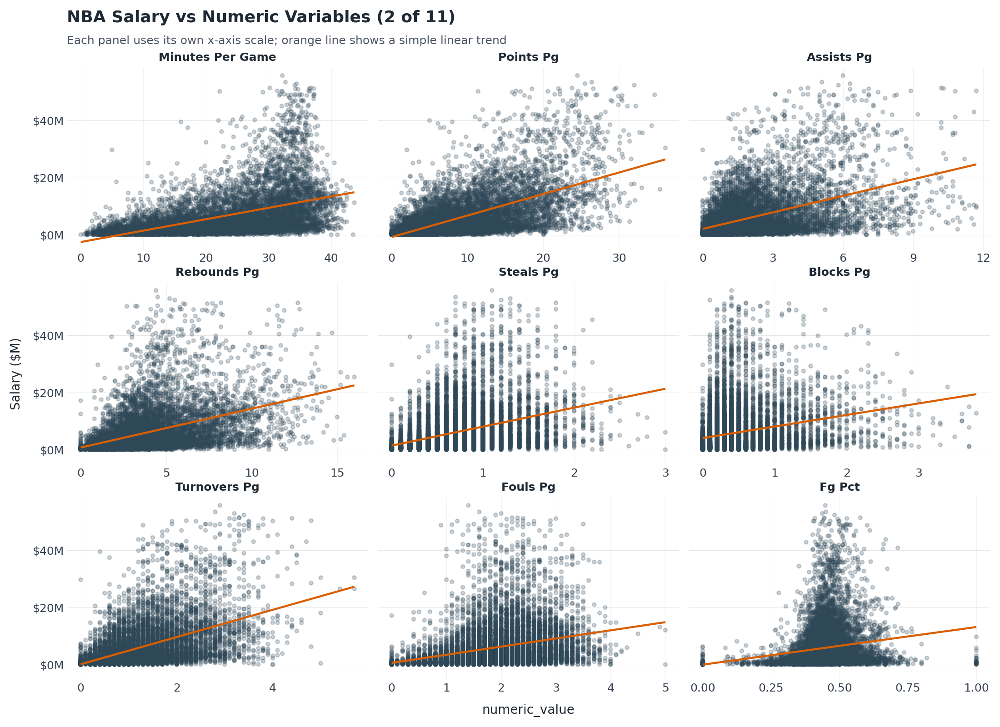

c:\Users\Dirks Wright\anaconda3\Lib\site-packages\plotnine\themes\themeable.py:2486: FutureWarning: You no longer need to use subplots_adjust to make space for the legend or text around the panels. This parameter will be removed in a future version. You can still use 'plot_margin' 'panel_spacing' for your other spacing needs.


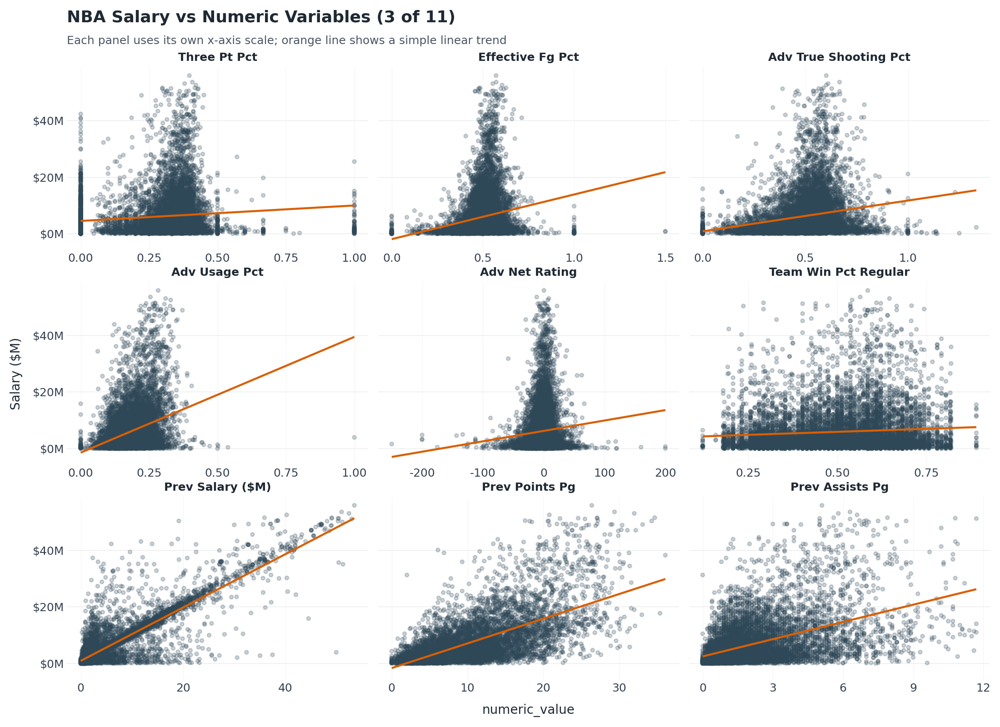

c:\Users\Dirks Wright\anaconda3\Lib\site-packages\plotnine\themes\themeable.py:2486: FutureWarning: You no longer need to use subplots_adjust to make space for the legend or text around the panels. This parameter will be removed in a future version. You can still use 'plot_margin' 'panel_spacing' for your other spacing needs.


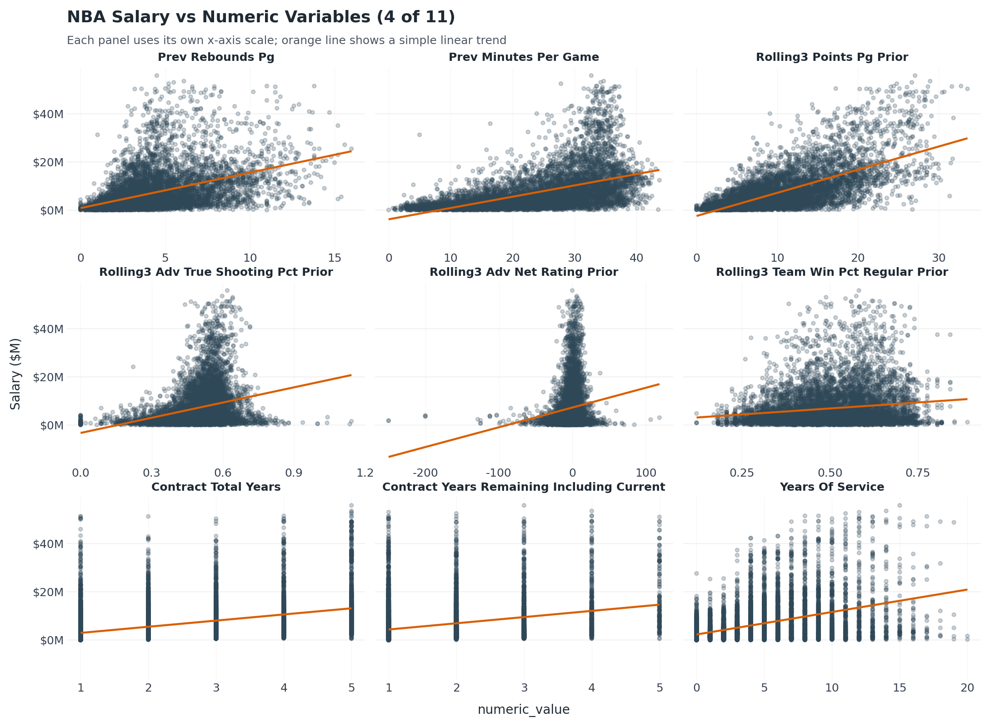

c:\Users\Dirks Wright\anaconda3\Lib\site-packages\plotnine\themes\themeable.py:2486: FutureWarning: You no longer need to use subplots_adjust to make space for the legend or text around the panels. This parameter will be removed in a future version. You can still use 'plot_margin' 'panel_spacing' for your other spacing needs.


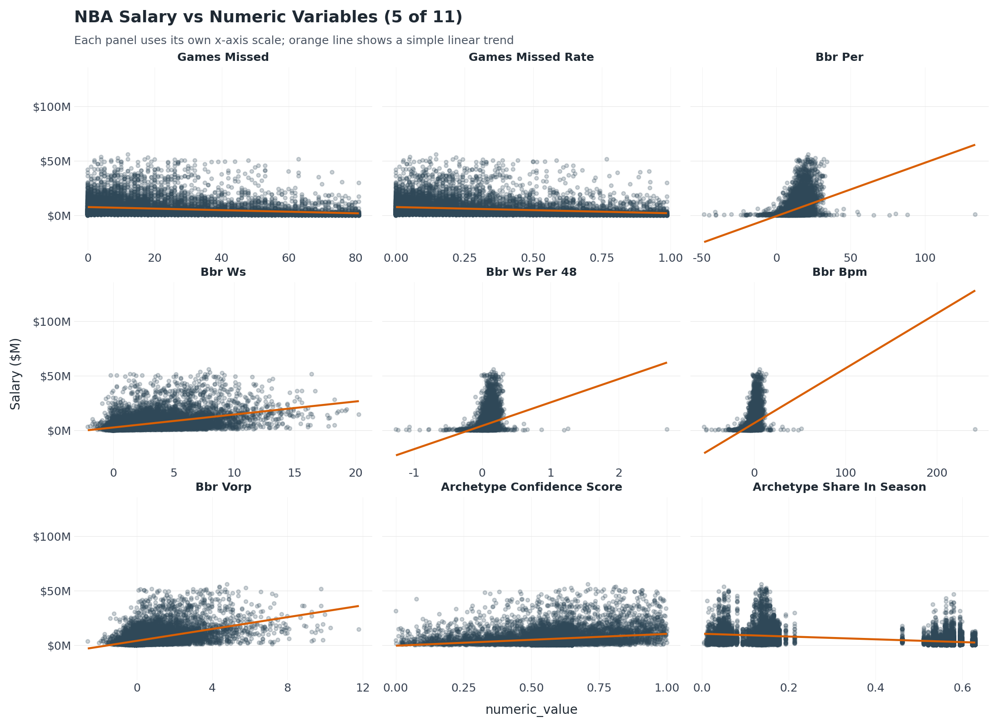

c:\Users\Dirks Wright\anaconda3\Lib\site-packages\plotnine\themes\themeable.py:2486: FutureWarning: You no longer need to use subplots_adjust to make space for the legend or text around the panels. This parameter will be removed in a future version. You can still use 'plot_margin' 'panel_spacing' for your other spacing needs.


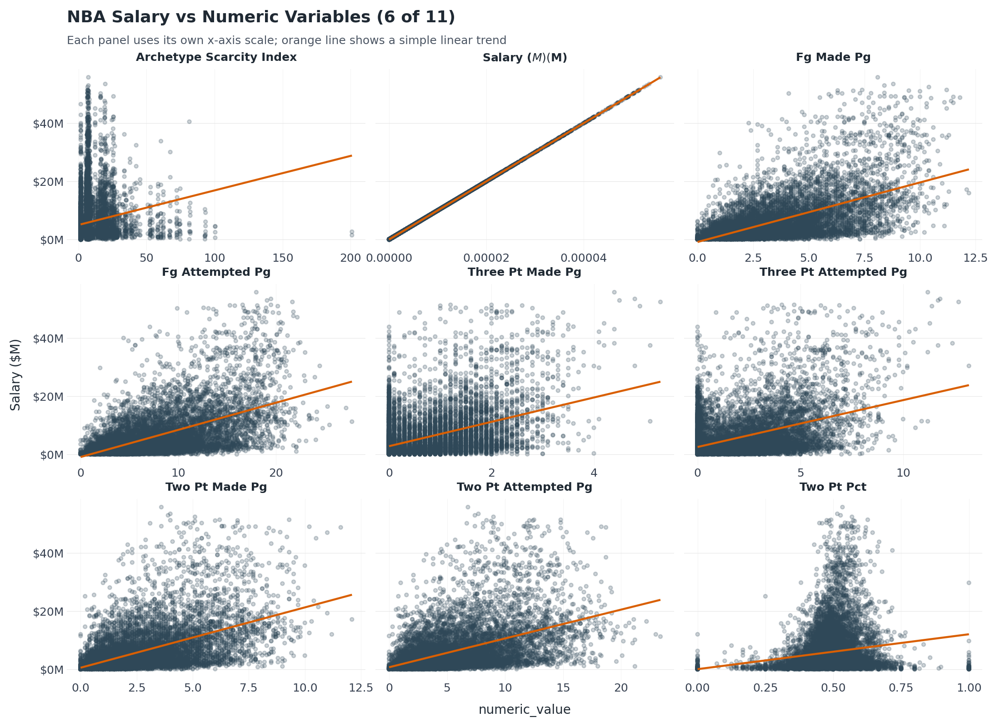

c:\Users\Dirks Wright\anaconda3\Lib\site-packages\plotnine\themes\themeable.py:2486: FutureWarning: You no longer need to use subplots_adjust to make space for the legend or text around the panels. This parameter will be removed in a future version. You can still use 'plot_margin' 'panel_spacing' for your other spacing needs.


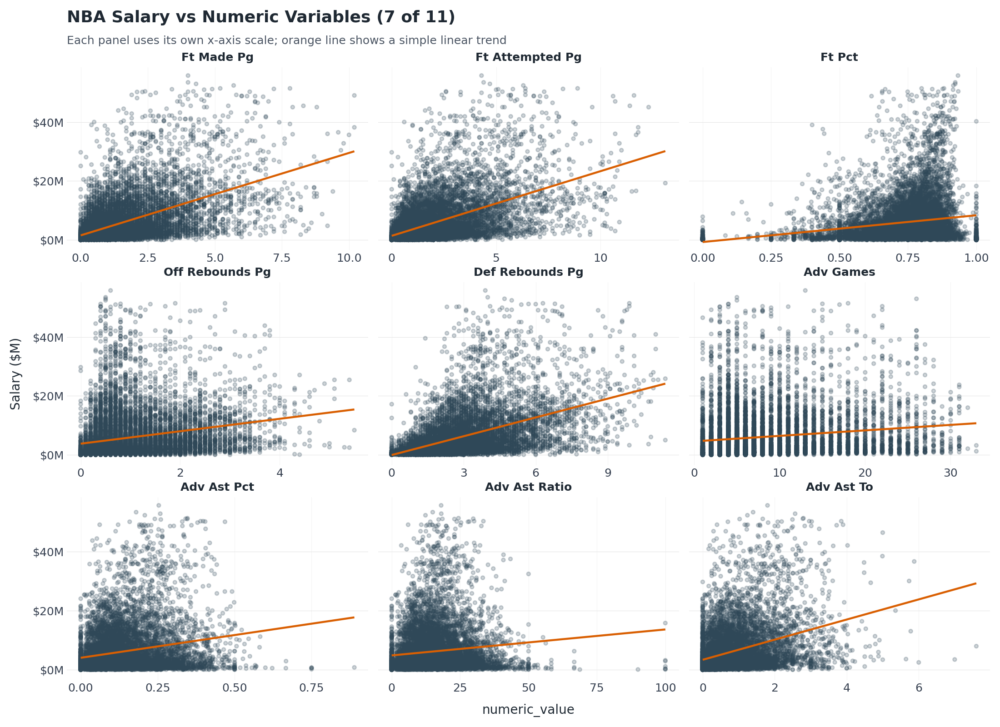

c:\Users\Dirks Wright\anaconda3\Lib\site-packages\plotnine\themes\themeable.py:2486: FutureWarning: You no longer need to use subplots_adjust to make space for the legend or text around the panels. This parameter will be removed in a future version. You can still use 'plot_margin' 'panel_spacing' for your other spacing needs.


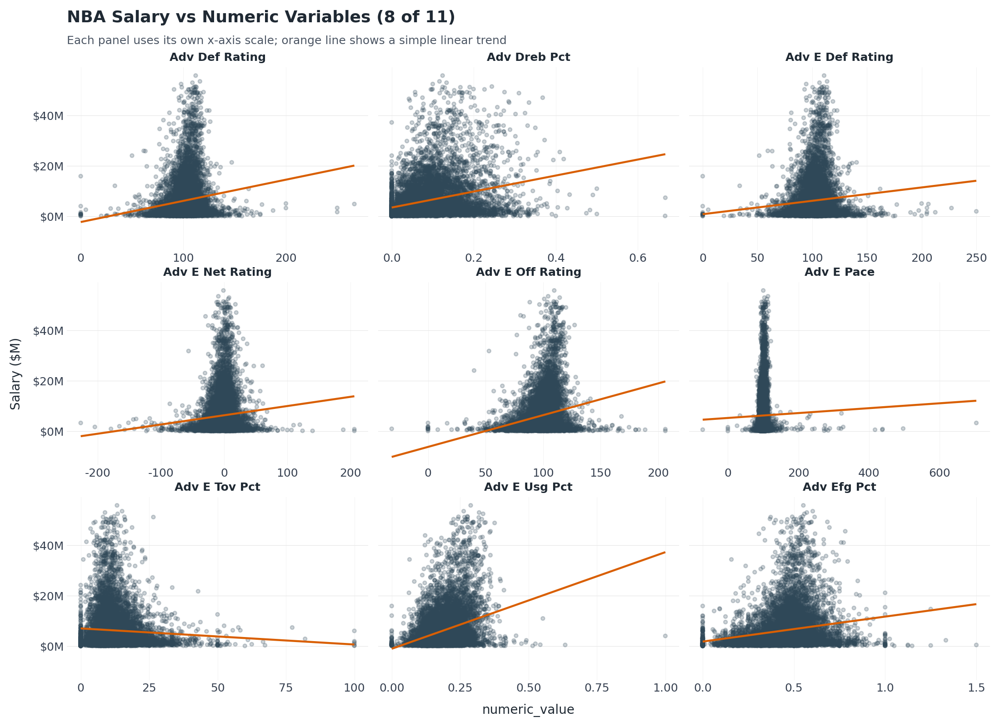

c:\Users\Dirks Wright\anaconda3\Lib\site-packages\plotnine\themes\themeable.py:2486: FutureWarning: You no longer need to use subplots_adjust to make space for the legend or text around the panels. This parameter will be removed in a future version. You can still use 'plot_margin' 'panel_spacing' for your other spacing needs.


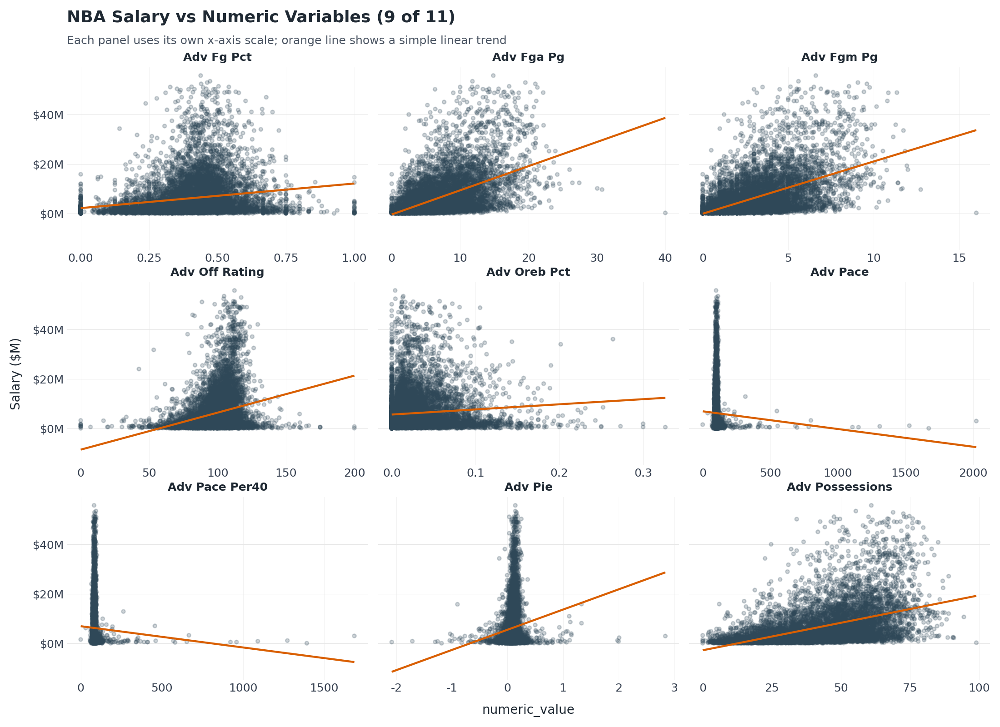

c:\Users\Dirks Wright\anaconda3\Lib\site-packages\plotnine\themes\themeable.py:2486: FutureWarning: You no longer need to use subplots_adjust to make space for the legend or text around the panels. This parameter will be removed in a future version. You can still use 'plot_margin' 'panel_spacing' for your other spacing needs.


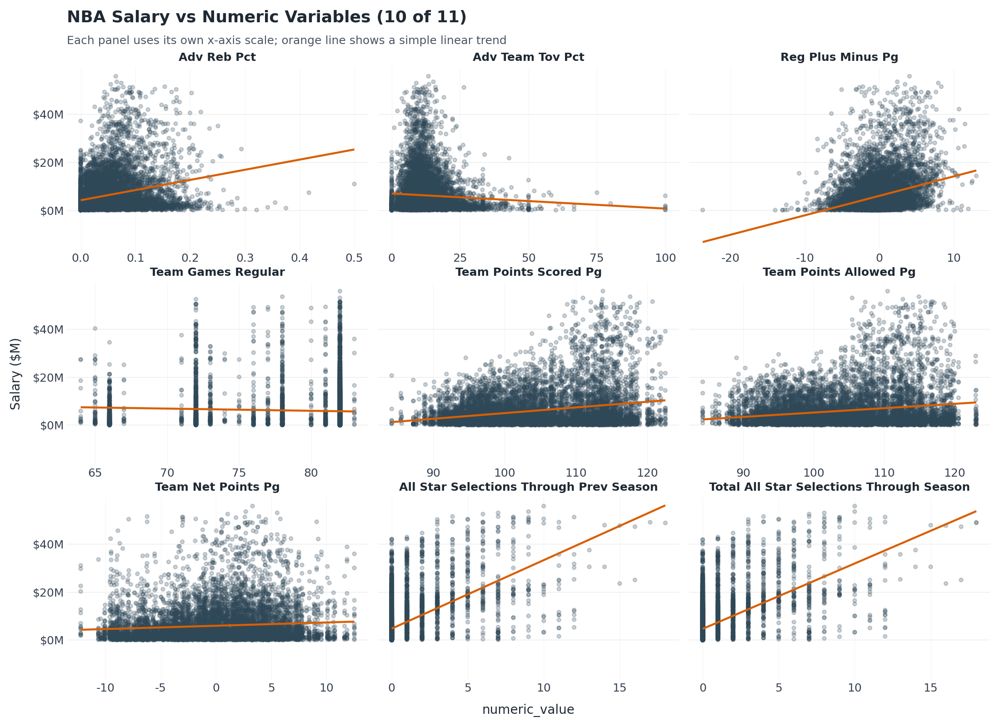

c:\Users\Dirks Wright\anaconda3\Lib\site-packages\plotnine\themes\themeable.py:2486: FutureWarning: You no longer need to use subplots_adjust to make space for the legend or text around the panels. This parameter will be removed in a future version. You can still use 'plot_margin' 'panel_spacing' for your other spacing needs.


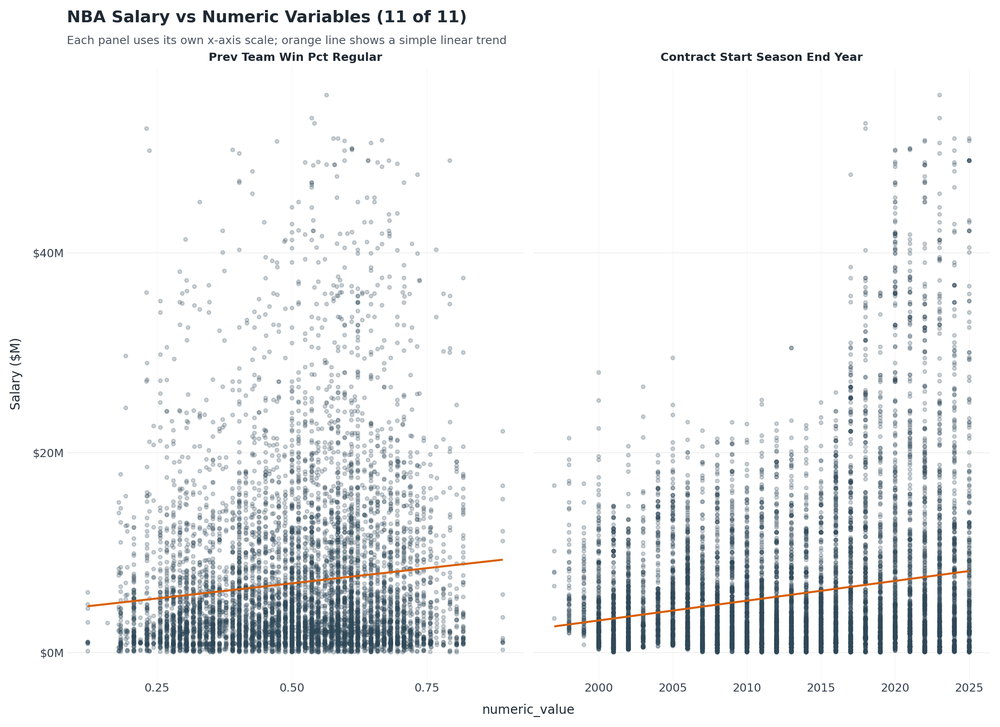

In [6]:
### scatterplots of numerical variables against target variable

numeric_salary_plot_df = df.dropna(subset=[salary_target]).copy()
numeric_salary_plot_df["salary_millions"] = numeric_salary_plot_df[salary_target] / 1_000_000

### scale salary-history predictors so their x-axes are also readable in millions
salary_history_cols = [
    col for col in numeric_salary_plot_df.columns
    if col != salary_target
    and "salary" in col
    and pd.api.types.is_numeric_dtype(numeric_salary_plot_df[col])
]

salary_history_plot_cols = []
for col in salary_history_cols:
    scaled_col = f"{col}_millions"
    numeric_salary_plot_df[scaled_col] = numeric_salary_plot_df[col] / 1_000_000
    salary_history_plot_cols.append(scaled_col)

indicator_prefixes = (
    "all_nba_",
    "all_def_",
    "archetype_is_",
    "cba_bucket_is_",
    "max_tier_is_",
    "position_primary_is_",
    "prev_all_",
    "team_region_",
    "won_",
)

indicator_cols = {
    col for col in numeric_salary_plot_df.select_dtypes(include=np.number).columns
    if col.startswith(indicator_prefixes)
    or numeric_salary_plot_df[col].nunique(dropna=True) <= 2
}

numeric_exclusions = {
    salary_target,
    "salary_millions",
    *salary_history_cols,
    *indicator_cols,
}

preferred_numeric_cols = [
    "season",
    "age",
    "height_inches",
    "weight_lbs",
    "draft_year",
    "draft_round",
    "draft_number",
    "games",
    "games_started",
    "minutes_per_game",
    "points_pg",
    "assists_pg",
    "rebounds_pg",
    "steals_pg",
    "blocks_pg",
    "turnovers_pg",
    "fouls_pg",
    "fg_pct",
    "three_pt_pct",
    "effective_fg_pct",
    "adv_true_shooting_pct",
    "adv_usage_pct",
    "adv_net_rating",
    "team_win_pct_regular",
    "prev_salary_millions",
    "prev_points_pg",
    "prev_assists_pg",
    "prev_rebounds_pg",
    "prev_minutes_per_game",
    "rolling3_points_pg_prior",
    "rolling3_adv_true_shooting_pct_prior",
    "rolling3_adv_net_rating_prior",
    "rolling3_team_win_pct_regular_prior",
    "contract_total_years",
    "contract_years_remaining_including_current",
    "years_of_service",
    "games_missed",
    "games_missed_rate",
    "bbr_per",
    "bbr_ws",
    "bbr_ws_per_48",
    "bbr_bpm",
    "bbr_vorp",
    "archetype_confidence_score",
    "archetype_share_in_season",
    "archetype_scarcity_index",
]

preferred_numeric_cols = [
    col for col in preferred_numeric_cols
    if col in numeric_salary_plot_df.columns
    and col not in numeric_exclusions
]

auto_numeric_cols = [
    col for col in numeric_salary_plot_df.select_dtypes(include=np.number).columns
    if col not in numeric_exclusions
    and col not in preferred_numeric_cols
    and numeric_salary_plot_df[col].nunique(dropna=True) >= 10
]

numeric_scatterplot_cols = list(dict.fromkeys(preferred_numeric_cols + salary_history_plot_cols + auto_numeric_cols))

numeric_plot_summary = pd.DataFrame({
    "numeric_variable": numeric_scatterplot_cols,
    "unique_values": [numeric_salary_plot_df[col].nunique(dropna=True) for col in numeric_scatterplot_cols],
    "non_missing_rows": [numeric_salary_plot_df[col].notna().sum() for col in numeric_scatterplot_cols],
})

display(numeric_plot_summary)

def build_linear_trend_data(long_plot_data):
    trend_frames = []

    for variable, group in long_plot_data.groupby("numeric_variable", observed=False):
        clean_group = group.dropna(subset=["numeric_value", "salary_millions"])

        if clean_group["numeric_value"].nunique(dropna=True) < 2:
            continue

        x = clean_group["numeric_value"].astype(float).to_numpy()
        y = clean_group["salary_millions"].astype(float).to_numpy()

        slope, intercept = np.polyfit(x, y, 1)
        x_line = np.linspace(x.min(), x.max(), 100)
        y_line = slope * x_line + intercept

        trend_frames.append(pd.DataFrame({
            "numeric_variable": variable,
            "numeric_value": x_line,
            "salary_millions": y_line,
        }))

    if trend_frames:
        return pd.concat(trend_frames, ignore_index=True)

    return pd.DataFrame(columns=["numeric_variable", "numeric_value", "salary_millions"])

def plot_salary_scatterplots_by_numeric(data, numeric_cols, page_size=9):
    valid_cols = [
        col for col in numeric_cols
        if col in data.columns
        and data[col].notna().sum() > 0
        and data[col].nunique(dropna=True) >= 2
    ]

    if not valid_cols:
        print("No valid numeric variables available for scatterplots.")
        return

    total_pages = int(np.ceil(len(valid_cols) / page_size))

    for start in range(0, len(valid_cols), page_size):
        page_cols = valid_cols[start:start + page_size]
        page_number = start // page_size + 1
        label_map = {col: pretty_variable_name(col.replace("_millions", " ($M)")) for col in page_cols}
        label_order = [label_map[col] for col in page_cols]

        long_plot_data = data[["salary_millions", *page_cols]].melt(
            id_vars="salary_millions",
            value_vars=page_cols,
            var_name="numeric_variable",
            value_name="numeric_value",
        ).dropna()

        long_plot_data["numeric_variable"] = long_plot_data["numeric_variable"].map(label_map)
        long_plot_data["numeric_variable"] = pd.Categorical(
            long_plot_data["numeric_variable"],
            categories=label_order,
            ordered=True,
        )

        trend_data = build_linear_trend_data(long_plot_data)
        trend_data["numeric_variable"] = pd.Categorical(
            trend_data["numeric_variable"],
            categories=label_order,
            ordered=True,
        )

        p = (
            ggplot(long_plot_data, aes(x="numeric_value", y="salary_millions"))
            + geom_point(color="#2F4858", alpha=0.24, size=1.15)
            + geom_line(
                data=trend_data,
                mapping=aes(x="numeric_value", y="salary_millions"),
                color="#D95F02",
                size=0.9,
                inherit_aes=False,
            )
            + facet_wrap("~ numeric_variable", scales="free_x", ncol=3)
            + scale_y_continuous(labels=dollar_millions)
            + labs(
                title=f"NBA Salary vs Numeric Variables ({page_number} of {total_pages})",
                subtitle="Each panel uses its own x-axis scale; orange line shows a simple linear trend",
                x=None,
                y="Salary ($M)",
            )
            + nba_eda_theme(width=11, height=8)
            + theme(
                strip_text=element_text(size=9, weight="bold", color="#1F2933"),
                subplots_adjust={"wspace": 0.18, "hspace": 0.28},
            )
        )

        display(p)

plot_salary_scatterplots_by_numeric(numeric_salary_plot_df, numeric_scatterplot_cols, page_size=9)
